# Coursework 2: Generative Models

## Instructions

Please submit on CATe two zip files:

*CW2.zip* containing the following:
1. A version of this notebook containing your answers. Write your answers in the cells below each question. **Please deliver the notebook including the outputs of the cells below.**
2. Your trained VAE model as *VAE_model.pth*

*GAN.zip* containing your trained Generator and Discriminator: *DCGAN_model_D.pth and DCGAN_model_G.pth*

Please avoid using markdown headings (# ## etc.) as these will affect the ToC. Instead use html headings if you want emphasis.

Similarly to the previous coursework, we recommend that you use Google Colaboratory in order to train the required networks.

TAs will run a testing cell (at the end of this notebook), so you are required to copy your transform and denorm functions to a cell near the bottom of the document (it is demarkated).

<font color="blue">**The deadline for submission is 19:00, Thursday 19th February, 2021** </font>

## Setting up working environment

For this coursework you, will need to train a large network, therefore we recommend you work with Google Colaboratory, which provides free GPU time. You will need a Google account to do so.

Please log in to your account and go to the following page: https://colab.research.google.com. Then upload this notebook.

For GPU support, go to "Edit" -> "Notebook Settings", and select "Hardware accelerator" as "GPU".

You will need to install pytorch and import some utilities by running the following cell:

In [14]:
!pip install -q torch torchvision altair matplotlib pandas
!git clone -q https://github.com/afspies/icl_dl_cw2_utils
from icl_dl_cw2_utils.utils.plotting import plot_tsne
%load_ext google.colab.data_table

fatal: destination path 'icl_dl_cw2_utils' already exists and is not an empty directory.
The google.colab.data_table extension is already loaded. To reload it, use:
  %reload_ext google.colab.data_table


In [15]:
from google.colab import drive
drive.mount('/content/drive') # Outputs will be saved in your google drive

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Introduction

For this coursework, you are asked to implement two commonly used generative models:
1. A **Variational Autoencoder (VAE)**
2. A **Deep Convolutional Generative Adversarial Network (DCGAN)**

For the first part you will the MNIST dataset https://en.wikipedia.org/wiki/MNIST_database and for the second the CIFAR-10 (https://www.cs.toronto.edu/~kriz/cifar.html).

Each part is worth 50 points. 

The emphasis of both parts lies in understanding how the models behave and learn, however, some points will be available for getting good results with your GAN (though you should not spend too long on this).

# Part 1 - Variational Autoencoder

## Part 1.1 (25 points)
**Your Task:**

a. Implement the VAE architecture with accompanying hyperparameters. Experiment with Feedforward and Convolutional Layers to see which gives better results.

b. Design an appropriate loss function and train the model.


In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/'):
    os.makedirs('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

Using cuda


---
## Part 1.1a: Implement VAE (25 Points)
###Hyper-parameter selection


In [ ]:
# Necessary Hyperparameters 
num_epochs = 15
learning_rate = 4e-04 
batch_size = 128
latent_dim = 16 # Choose a value for the size of the latent space

# Additional Hyperparameters 
beta_kld = 2
recon_loss = nn.BCELoss(reduction='sum')
k_size = 4 # Convolution kernel
init_ch = 8 # Initial number of filters in encoding.
img_ch = 1 # Grayscale has 1 channel only.


# (Optionally) Modify transformations on input
transform = transforms.Compose([
    transforms.ToTensor(),
    lambda x: x.round()
])

# (Optionally) Modify the network's output for visualizing your images
def denorm(x):
    return x

### Data loading


In [ ]:
train_dat = datasets.MNIST(
    "data/", train=True, download=True, transform=transform
)
test_dat = datasets.MNIST("data/", train=False, transform=transform)

loader_train = DataLoader(train_dat, batch_size, shuffle=True)
loader_test = DataLoader(test_dat, batch_size, shuffle=False)

# Don't change 
sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[:32, :, :, :]
save_image(fixed_input, '/content/drive/MyDrive/icl_dl_cw2/CW_VAE/image_original.png')

### Model Definition

<figure>
  <img src="https://blog.bayeslabs.co/assets/img/vae-gaussian.png" style="width:60%">
  <figcaption>
    Fig.1 - VAE Diagram (with a Guassian prior), taken from <a href="https://blog.bayeslabs.co/2019/06/04/All-you-need-to-know-about-Vae.html">1</a>.
  </figcaption>
</figure>


You will need to define:
* The hyperparameters
* The constructor
* encode
* reparametrize
* decode
* forward



Hints:
- It is common practice to encode the log of the variance, rather than the variance
- You might try using BatchNorm

In [ ]:
# *CODE FOR PART 1.1a IN THIS CELL*

class VAE(nn.Module):
    def __init__(self, latent_dim):
        super(VAE, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        

        self.latent_dim = latent_dim

        ####### Encoder ##########
        self.convolutional_encoder = nn.Sequential(
            nn.Conv2d(in_channels = img_ch, out_channels = init_ch, 
                      kernel_size = k_size , stride = 1, padding = 2),
            nn.BatchNorm2d(init_ch),
            nn.ReLU(),
            nn.Conv2d(in_channels = init_ch, out_channels = init_ch * 2, 
                      kernel_size = k_size, stride = 2, padding = 1),
            nn.BatchNorm2d(init_ch * 2),
            nn.ReLU(),        
            nn.Conv2d(in_channels = init_ch * 2, out_channels = init_ch * 4, 
                      kernel_size = k_size, stride = 2, padding = 1),
            nn.BatchNorm2d(init_ch * 4),
            nn.ReLU(), 
            nn.Conv2d(in_channels = init_ch * 4, out_channels = 64, 
                      kernel_size = k_size, stride = 2, padding = 0),
            nn.BatchNorm2d(64),
            nn.ReLU()
        )

        ####### Fully Connected Layers #######
        self.fc1 = nn.Linear(64, 128)
        self.fc_mu = nn.Linear(128, latent_dim)
        self.fc_log_var = nn.Linear(128, latent_dim)
        self.fc2 = nn.Linear(latent_dim, 64)

        ####### Decoder ##########
        self.convolutional_decoder = nn.Sequential(
            nn.ConvTranspose2d(in_channels = 64, out_channels = init_ch * 8,
                               kernel_size = k_size, stride = 1, padding = 0),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels = init_ch * 8, out_channels = init_ch * 4,
                               kernel_size = k_size, stride = 2, padding = 1),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels = init_ch * 4, out_channels = init_ch * 2,
                               kernel_size = k_size, stride = 2, padding = 2),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels = init_ch * 2, out_channels = img_ch,
                               kernel_size = k_size, stride = 2, padding = 1),
            nn.Sigmoid()
        )

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    def encode(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        
        # Convolutional encoder.
        x = self.convolutional_encoder(x)

        # Reshaping.
        batch, _, _, _ = x.shape
        x = F.adaptive_avg_pool2d(x, 1).reshape(batch, -1)

        # Get to hidden layer.
        hid = self.fc1(x)

        # Get `mu` and `log_var`.
        mu = self.fc_mu(hid)
        log_var = self.fc_log_var(hid)

        return mu, log_var

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def reparametrize(self, mu, logvar):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

    def decode(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        
        return self.convolutional_decoder(z)
        
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        
        # Encode.
        mu, log_var = self.encode(x)

        # Reparametrize.
        sample = self.reparametrize(mu, log_var)
        sample = self.fc2(sample)
        sample = sample.view(-1, 64, 1, 1)
 
        # Decode.
        rec = self.convolutional_decoder(sample)

        return rec, mu, log_var
        
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

model = VAE(latent_dim).to(device)
params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))
print(model)
# optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

Total number of parameters is: 163897
VAE(
  (convolutional_encoder): Sequential(
    (0): Conv2d(1, 8, kernel_size=(4, 4), stride=(1, 1), padding=(2, 2))
    (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(8, 16, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): Conv2d(16, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2))
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU()
  )
  (fc1): Linear(in_features=64, out_features=128, bias=True)
  (fc_mu): Linear(in_features=128, out_features=16, bias=True)
  (fc_log_var): Linear(in_features=128, out_features=16, bias=True)
  (fc2): Linear(in_f

--- 

## Part 1.1b: Training the Model (5 Points)

### Defining a Loss
Recall the Beta VAE loss, with an encoder $q$ and decoder $p$:
$$ \mathcal{L}=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$

In order to implement this loss you will need to think carefully about your model's outputs and the choice of prior.

There are multiple accepted solutions. Explain your design choices based on the assumptions you make regarding the distribution of your data.

* Hint: this refers to the log likelihood as mentioned in the tutorial. Make sure these assumptions reflect on the values of your input data, i.e. depending on your choice you might need to do a simple preprocessing step.

* You are encouraged to experiment with the weighting coefficient $\beta$ and observe how it affects your training

In [ ]:
# *CODE FOR PART 1.1b IN THIS CELL*

def loss_function_VAE(recon_x, x, mu, logvar, beta):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
       
        # Recon loss function is a tunable hyperparameter, 
        # Chosen Binary Cross Entropy (BCE).
        BCE = recon_loss(recon_x, x)

        # KLD Loss calculation.
        KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
        
        # Return all three losses for easiness in retrieval.
        return beta * KLD + BCE, BCE, beta * KLD      
        
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 


model.train()

# Helper Variables.
print_every = 250
log_train_loss = []
log_test_loss = []
record_test = True

for epoch in range(num_epochs):     
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        
        # Initialise loss accumulators for train and testing (Total, BCE, KLD).
        train_losses = (0, 0, 0) 
        test_losses = (0, 0, 0)

        print("Training Epoch " + str(epoch))

        # Batch loop.
        for batch_idx, (data, _) in enumerate(loader_train):
            
            # Get Data.
            data = data.to(device)
            optimizer.zero_grad()

            # Forward.
            recon_x, mu, logvar = model.forward(data)

            # Get loss.
            loss, BCE, KLD = loss_function_VAE(recon_x, data, mu, logvar, beta_kld)
            
            train_losses = tuple(np.add(train_losses, (loss.item(), BCE.item(), KLD.item())))
            
            # Step.
            loss.backward()
            optimizer.step()

            # Print a loss every once in a while to track.
            if batch_idx % print_every == 0:
                print('\t Batch Progress: [{}/{}] \t Loss: {:<15}'.format( 
                          batch_idx * len(data), 
                          len(loader_train.dataset),
                          round(float(loss.data / len(data)), 6)
                      )
                )
        
        # Print Average Loss for that Epoch.
        print('-------- Average loss: {:.4f} -------- \n'.format(
                  train_losses[0] / len(loader_train.dataset)
              )
        )
        
        # Append loss to accumulator.
        log_train_loss.append(train_losses)


        # If recording also the performance on test set.
        if record_test:
            with torch.no_grad():
                for data, _ in loader_test:
                    # Get Data.
                    data = data.to(device)
        
                    # Forward.   
                    recon_x, mu, logvar = model.forward(data)

                    # Get loss.
                    loss, BCE, KLD = loss_function_VAE(recon_x, data, mu, logvar, beta_kld)
                    test_losses = tuple(np.add(test_losses, (loss.item(), BCE.item(), KLD.item())))

        # Append loss to accumulator.
        log_test_loss.append(test_losses)

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
        # save the model
        if epoch == num_epochs - 1:
            with torch.no_grad():
                torch.jit.save(torch.jit.trace(model, (data), check_trace=False),
                    '/content/drive/MyDrive/icl_dl_cw2/CW_VAE/VAE_model.pth')



Training Epoch 0
	 Batch Progress: [0/60000] 	 Loss: 516.829407     
	 Batch Progress: [32000/60000] 	 Loss: 189.083755     
-------- Average loss: 219.6029 -------- 

Training Epoch 1
	 Batch Progress: [0/60000] 	 Loss: 166.160019     
	 Batch Progress: [32000/60000] 	 Loss: 150.821243     
-------- Average loss: 147.2709 -------- 

Training Epoch 2
	 Batch Progress: [0/60000] 	 Loss: 137.353195     
	 Batch Progress: [32000/60000] 	 Loss: 141.039978     
-------- Average loss: 134.2713 -------- 

Training Epoch 3
	 Batch Progress: [0/60000] 	 Loss: 130.417206     
	 Batch Progress: [32000/60000] 	 Loss: 122.030861     
-------- Average loss: 127.2899 -------- 

Training Epoch 4
	 Batch Progress: [0/60000] 	 Loss: 128.825241     
	 Batch Progress: [32000/60000] 	 Loss: 126.792511     
-------- Average loss: 122.9722 -------- 

Training Epoch 5
	 Batch Progress: [0/60000] 	 Loss: 118.045326     
	 Batch Progress: [32000/60000] 	 Loss: 123.034012     
-------- Average loss: 120.0699 ---

In [ ]:
## FOR FURTHER VISUALISATION PURPOSES:
if beta_kld == 0.5:
    log_train_loss_05 = log_train_loss
    log_test_loss_05 = log_test_loss
elif beta_kld == 2:
    log_train_loss_2 = log_train_loss
    log_test_loss_2 = log_test_loss
elif beta_kld == 10:
    log_train_loss_10 = log_train_loss
    log_test_loss_10 = log_test_loss


### Loss Explanation
Explain your choice of loss and how this relates to:

* The VAE Prior
* The output data domain
* Disentanglement in the latent space


In [ ]:
# Any code for your explanation here

**YOUR ANSWER**

***Loss choice***

The loss of the VAE encompasses two elements: the reconstruction error between output and input and the negative KL divergence between the latent variable's variational posterior and prior. For the latter a gaussian sampler was deemed appropriate, as it enforces that the average of samples, when samples tend to infinity, follows itself a gaussian distribution (Central Limit Theorem). Furthermore, a Monte-Carlo approximation is performed, i.e. I take the sum of all the pixels' log probabilities in the mini-batch.

***Data Considerations***

The data used in this task is continuous. Therefore I performed an extra preprocessing step to binarize the data.
Changing the input image into binary allowed the decoder to better capture the  Bernoulli parameters in the output returned by the last sigmoid activation.
This procedure resulted in a significant increase in performance of the network.


***Disentanglement in the latent space***

The hyperparameter beta_kld is passed as an argument of the loss function and regulates the augmentation of the KLD factor. In a thorough analysis of how changing this parameter effects the latent space visualisation, it can be appreciated that the disentanglement is more and more pronounced as beta_kld increases. This observation can be theoretically explained by considering that this parameter is simply modifying the dominance of a the KLD term over the BCE one. 
A large KLD impact on the loss forces the probability distributions from the latent space to resemble a true gaussian, while  a dominant BCE term, results in the effort of minimising the reconstruction loss, losing information about the variational prior. The former causes a loss of generalisation, while the latter causes some features to correlate with each-other, causing some intrinsically more similar classes - such as '4' and '9' - to overlap. The optimal value for the beta_kld hyperparameter was found to be 2.







<h2>Part 1.2 (9 points)</h2>

a. Plot your loss curves

b. Show reconstructions and samples

c. Discuss your results from parts (a) and (b)

## Part 1.2a: Loss Curves (3 Points)
Plot your loss curves (6 in total, 3 for the training set and 3 for the test set): total loss, reconstruction log likelihood loss, KL loss (x-axis: epochs, y-axis: loss). If you experimented with different values of $\beta$, you may wish to display multiple plots (worth 1 point).

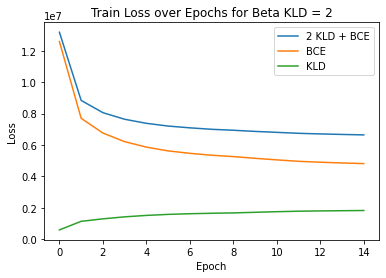

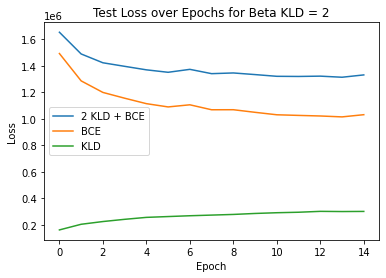

In [ ]:
# *CODE FOR PART 1.2a IN THIS CELL*

def plot_loss(log, what_set, beta):
    leg = [str(beta) + ' KLD + BCE', 'BCE', 'KLD']
    plt.figure()
    plt.plot(log)
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(what_set + ' Loss over Epochs for Beta KLD = ' + str(beta))
    plt.legend(leg)

## THIS IS THE ONE FOR THE CHOSEN BETA_KLD = 2 FOR THE FINAL MODEL ##
plot_loss(log_train_loss_2, 'Train', 2)
plot_loss(log_test_loss_2, 'Test', 2)





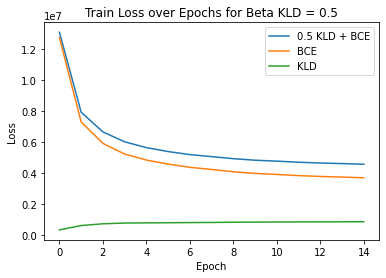

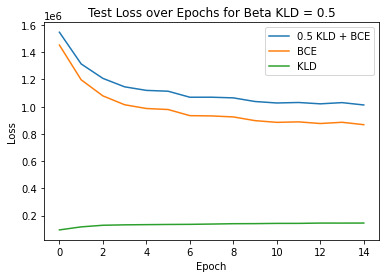

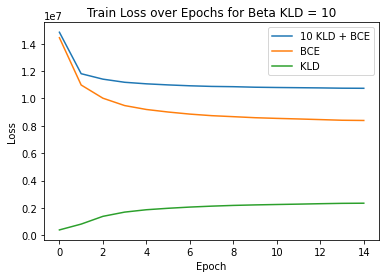

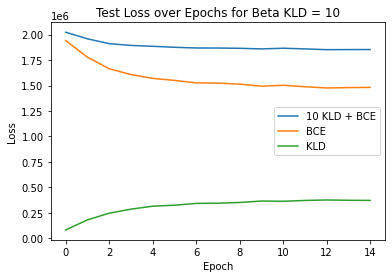

In [ ]:
## THESE ARE JUST FOR SHOWING THE EFFECT OF DIFFERENT BETAS! ##
# to replicate run the training with different betas and save in different arrays
# the log losses, then plot them here.

plot_loss(log_train_loss_05, 'Train', 0.5)
plot_loss(log_test_loss_05, 'Test', 0.5)

plot_loss(log_train_loss_10, 'Train', 10)
plot_loss(log_test_loss_10, 'Test', 10)

## Part 1.2b: Samples and Reconstructions (6 Points)
Visualize a subset of the images of the test set and their reconstructions **as well as** a few generated samples. Most of the code for this part is provided. You only need to call the forward pass of the model for the given inputs (might vary depending on your implementation).

Input images
--------------------------------------------------
Reconstructed images
--------------------------------------------------
Generated Images
--------------------------------------------------


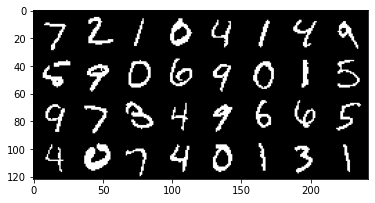

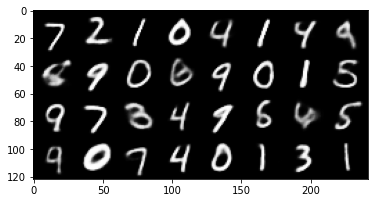

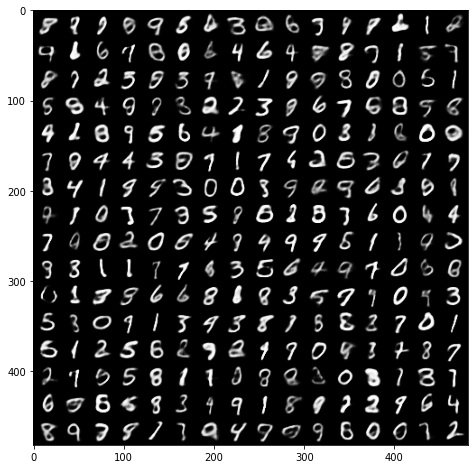

In [ ]:
# *CODE FOR PART 1.2b IN THIS CELL*

# load the model
print('Input images')
print('-'*50)

sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[0:32, :, :, :]
# visualize the original images of the last batch of the test set
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
show(img)

print('Reconstructed images')
print('-'*50)
with torch.no_grad():
    # visualize the reconstructed images of the last batch of test set
    
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    recon_batch, mu, log_var = model.forward(fixed_input.to(device))
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    recon_batch = recon_batch.cpu()
    recon_batch = make_grid(denorm(recon_batch), nrow=8, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure()
    show(recon_batch)

print('Generated Images')  
print('-'*50)
model.eval()
n_samples = 256
z = torch.randn(n_samples,latent_dim).to(device)
with torch.no_grad():
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    samples = model.fc2(z)
    samples = samples.view(-1, 64, 1, 1)

    # DECODE
    samples = model.convolutional_decoder(samples)
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    samples = samples.cpu()
    samples = make_grid(denorm(samples), nrow=16, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (8,8))
    show(samples)



### Discussion
Provide a brief analysis of your loss curves and reconstructions: 
* What do you observe in the behaviour of the log-likelihood loss and the KL loss (increasing/decreasing)?
* Can you intuitively explain if this behaviour is desirable? Have you observed posterior collapse during traing (i.e. when the KL is too small during the early stages of training)? 
    * If yes, how did you mitigate it? How did this phenomenon reflect on your output samples?
    * If no, why do you think that is?

**YOUR ANSWER**

***Observations of the losses' Behaviour***

Visualising the loss of both the training and test set gives a pretty good understanding of the overfitting of the model. Looking at the plots, it can be appreciated that both the train and test set follow a similar curve that is steadily decreasing, therefore the model is not overfitting. 
Furthermore, the BCE and KLD curves in all plots provided for different beta_kld magnitudes can give further insights on how the model is coping with the issues presented in part 1.1b on balancing the two losses components. As discussed, balancing out well the effects of the KLD and BCE losses would result in a model with both good generalisation capabilities and a disentangled enough latent space such that no classes are significantly overlapping. By looking at the latent space visualisation, I think this desirable state is achieved well. Furthermore it can be noticed that the BCE is greater than the KLD, but the latter is increasing at a stable rate, while the former is steadily decreasing also at a stable rate. This controlled increase in KLD is a desirable behaviour, as it causes the model to learn more information, hence have a better differentiation among classes in the latent space.

***Posterior Collapse***

In the final implementation the posterior collapse phenomenon cannot be detected. This is due to the tuning of the beta_kld hyperparameter, which allows the two loss components to not dominate each other. However, for the purpose of studying this phenomenon and its effects, one can set the beta_kld parameter value to be quite large (i.e. at least 10). 
When the KLD component contributes so much, the decoder is uncapable of making use of the information in the latent dimension. This happens because the BCE term becomes less significant as the KLD one increases in magnitude, resultiing in a less focus of the VAE towards the reconstruction loss. As a consequence, the generation of digits visualised in part 1.2b becomes tremendously noisier. 

---
<h2> Part 1.3 (11 points) <h2/>

Qualitative analysis of the learned representations

In this question you are asked to qualitatively assess the representations that your model has learned. In particular:

a. Dimensionality Reduction of learned embeddings

b. Interpolating in the latent space

## Part 1.3a: T-SNE on Embeddings (7 Points)
Extract the latent representations of the test set and visualize them using [T-SNE](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding)  [(see implementation)](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html). 

We've provided a function to visualize a subset of the data, but you are encouraged to also produce a matplotlib plot (please use different colours for each digit class).

In [ ]:
# *CODE FOR PART 1.3a IN THIS CELL
from sklearn.manifold import TSNE
import seaborn as sns

# Load Pretrained model weights.
pretrained_model = torch.jit.load('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/VAE_model.pth')
model.load_state_dict(pretrained_model.state_dict())

# Load test data.
data = ((loader_test.dataset.data).view(-1, 1, 28, 28)).float() / 255
targets = loader_test.dataset.targets

# Sample mu and log_var.
sample_mu, sample_log_var = model.encode(data.to(device))
sample = model.reparametrize(sample_mu, sample_log_var)
sample = sample.cpu()

with torch.no_grad():
    # T-SNE on Embeddings.
    tsne = TSNE(n_components = 2, verbose = 0, perplexity = 50, n_iter = 500)
    z_embedded = tsne.fit_transform(sample.detach().numpy())

In [ ]:
# Interactive Visualization - Code Provided
test_dataloader = DataLoader(test_dat, 10000, shuffle=False)
""" Inputs to the function are
        z_embedded - X, Y positions for every point in test_dataloader
        test_dataloader - dataloader with batchsize set to 10000
        num_points - number of points plotted (will slow down with >1k)
"""
plot_tsne(z_embedded, test_dataloader, num_points=1000, darkmode=False)


alt.HConcatChart(...)

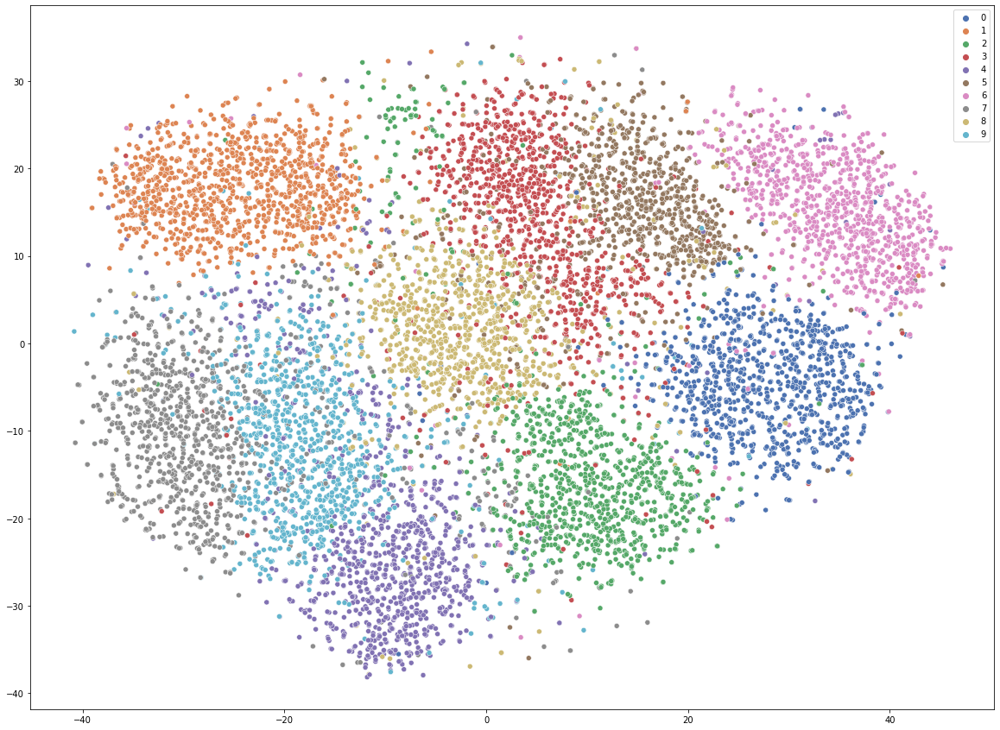

In [ ]:
# Custom Visualizations
x, y = z_embedded[:, 0], z_embedded[:, 1]

# Plot. 
plt.figure(figsize=(20,15))
sns.scatterplot(
    x = x, y = y,
    hue = targets,
    palette = sns.color_palette("deep", 10),
    legend="full"
)

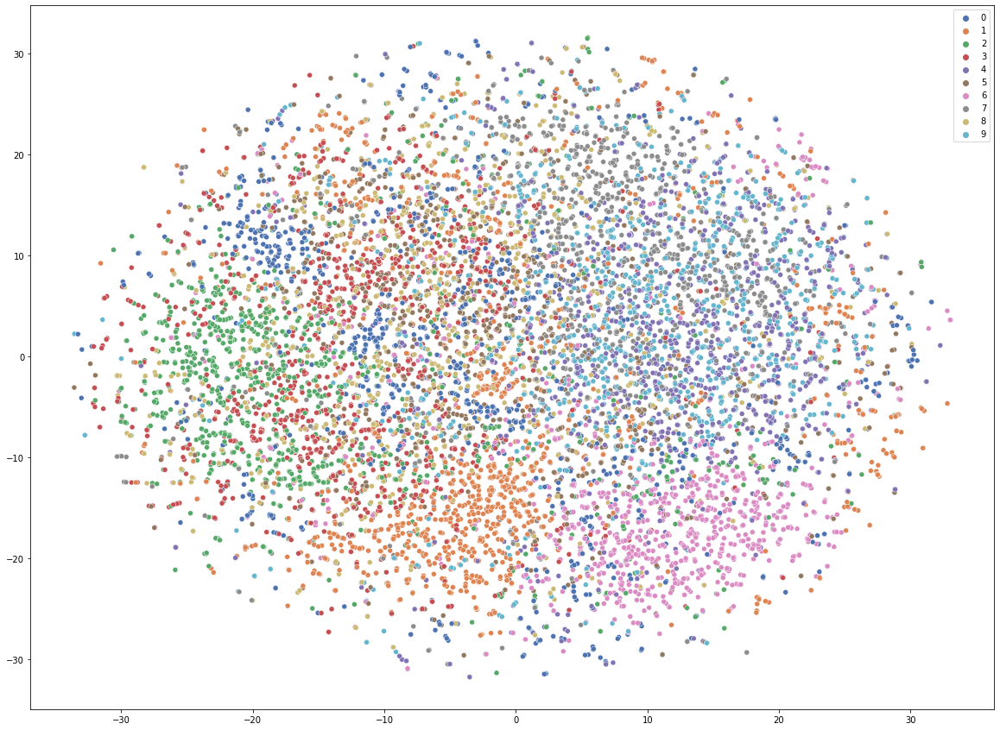

In [ ]:
##### VISUALISATION WITH beta_kld = 10 TO SHOW POSTERIOR COLLAPSE ####

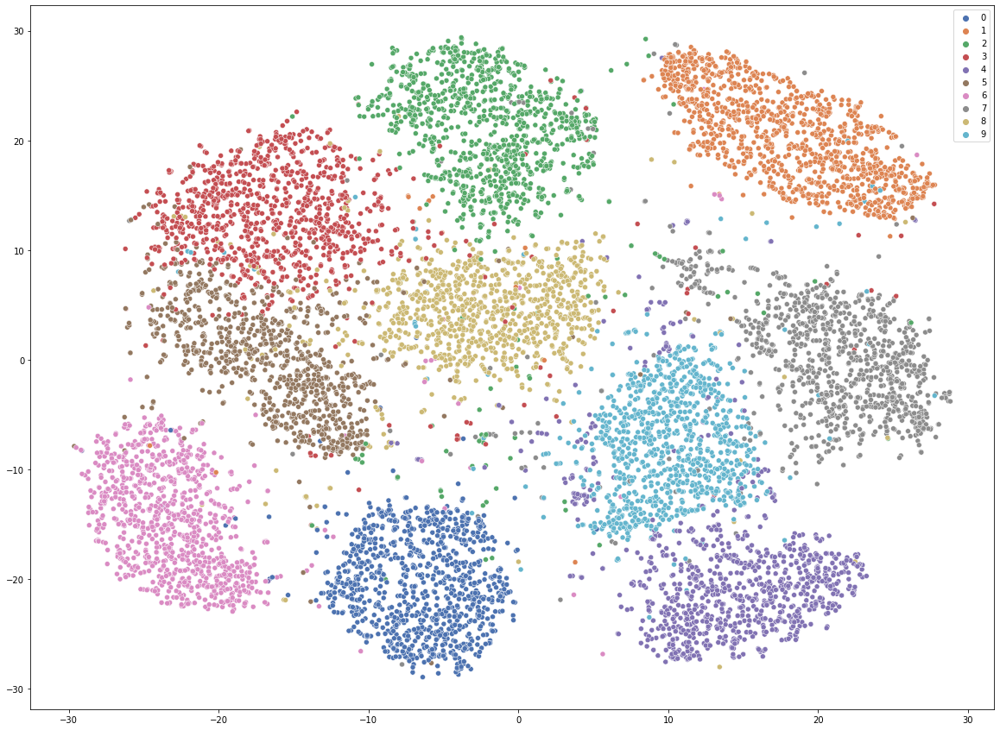

In [ ]:
##### VISUALISATION WITH beta_kld = 0.5 TO SHOW SCATTERING ####

### Discussion
What do you observe? Discuss the structure of the visualized representations. 
* What do you observe? What role do the KL loss term and $\beta$ have, if any, in what you observe (multiple matplotlib plots may be desirable here)?
    * Consider Outliers
    * Counsider Boundaries
    * Consider Clusters
* Is T-SNE reliable? What happens if you change the parameters (don't worry about being particularly thorough). [This link](https://distill.pub/2016/misread-tsne/) may be helpful.

**YOUR ANSWER**

***Testing with different beta_kld***

The visualisation of the T-SNE yields several considerations on the latent space and mostly on how the beta_kld parameter effects the clustering on such space. During testing and as shown by the correspondent plots it is clear that decreasing the value of beta_kld increased the separation among clusters. This phenomenon is theoretically explained by considering the effect that a small KLD has on the overall loss. It has the effect of making the constraint on the posterior stricter, therefore causing the scattering of classes far away from each other in the latent space. Hence in edge cases like beta_kld <= 0.5, the clusters start to be scattered all over the space, far away from each-other. The opposite happens when beta_kld is very large. Increasing the beta_kld to 10 proved to be enough to set such a strict constraint on the posterior such as the result would be just a complete overlapping of clusters, with no boundaries and ways to differentiate them.

***Ideal Behaviour and Design Choice***

Therefore, the final implementation opts for a beta_kld of value 2, as it demonstrates visually that it defines fairly distinguishable boundaries between clusters, while keeping them tight in a unique figure that does not account for white spaces among clusters. 

***Outliers and Clusters Position***

Finally, some considerations can be drawn by the position of the clusters. As it is further discussed in the interpolating section, similar digits are correctly clusterised as close toghether (for example 4, 5 and 9 share quite a lot of overlapping). Oppositely, completely different digits such as 1 and 0 are at the opposite sides of the space. In this sense, it is clear that clusters that represent digits that can be easily mistaken with others (such as 4, 5 and 9) would have more outliers than clusters that represent very recognisable digits. This outliers density is also nicely visualised in the plot above for beta_kld = 2.



## Part 1.3b: Interpolating in $z$ (4 Points)
Perform a linear interpolation in the latent space of the autoencoder by choosing any two digits from the test set. What do you observe regarding the transition from on digit to the other?


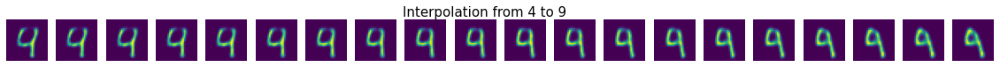

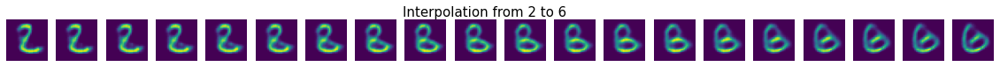

In [ ]:
# CODE FOR PART 1.3b IN THIS CELL
import torch


def interpolate(index1, index2, nInterpolate = 10):
    
    # Helpers.
    is_idx1 = targets == index1
    is_idx2 = targets == index2

    # dig1 and dig2 Definitions
    dig1 = torch.sum(is_idx1)
    dig2  = torch.sum(is_idx2)

    smaller_digit = min(dig1, dig2)

    # Compute references and targets.
    ref = data[is_idx1][:smaller_digit]
    ref = ref.to(device)

    tar = data[is_idx2][:smaller_digit]
    tar = tar.to(device)

    # Sample ref.
    ref_sample_mu, ref_sample_log_var = model.encode(ref)
    ref_sample = model.reparametrize(ref_sample_mu, ref_sample_log_var)
    ref_sample = model.fc2(ref_sample)
    ref_sample = ref_sample.view(-1, 64, 1, 1)
    ref_sample = ref_sample.cpu()  

    # Sample tar.
    tar_sample_mu, tar_sample_log_var = model.encode(tar)
    tar_sample = model.reparametrize(tar_sample_mu, tar_sample_log_var)
    tar_sample = model.fc2(tar_sample)
    tar_sample = tar_sample.view(-1, 64, 1, 1)
    tar_sample = tar_sample.cpu()  

    emb_val = []
    for i in range(nInterpolate):
        emb_val.append(
            tar_sample * (i / nInterpolate) + ref_sample * (nInterpolate - i) / 
            nInterpolate
        ) 
    
    rec = []
    for emb in emb_val:
        rec.append(model.decode(emb.to(device)))
    rec = torch.stack(rec)

    # Move all to cpu.
    rec = rec.cpu()
    ref = ref.cpu()
    tar = tar.cpu()

    plt.figure(figsize=(nInterpolate, 2))
    plt.suptitle('Interpolation from ' + str(index1) + ' to ' + str(index2), fontsize=15)
    for idx, reconstructed in enumerate(rec.detach().numpy()):
        plt.subplot(2,nInterpolate, idx + 1)
        plt.axis('off')
        plt.imshow(reconstructed[0][0])


emb_smooth = interpolate(4, 9, 20)
emb_smooth = interpolate(2, 6, 20)

### Discussion
What did you observe in the interpolation? Is this what you expected?
* Can you relate the interpolation to your T-SNE visualization

**YOUR ANSWER**

Interpolation from one latent space to another, i.e. moving from one class to the other, is a common tecnique to analyse the latent dimension of a model.
Clusters that are closed to one another in the T-SNE visualisation are expected to have a smooth transition, as the path from start to destination does not cross any other cluster. For example, I have plotted above the transition from class '4' to '9', that are extremely close in the T-SNE visualization. As expected, the transition is very smooth.
On the contrary, when interpolating between distant latent spaces, such as '2' and '6' there is a much less smooth transiton, where it seems to be transitioning to a '8' before finally resembling a '6'. This distance between the two clusters can be visually appreciated in the T-SNE visualisation too.

# Part 2 - Deep Convolutional GAN

In this task, your main objective is to train a DCGAN (https://arxiv.org/abs/1511.06434) on the CIFAR-10 dataset. You should experiment with different architectures, tricks for stability in training (such as using different activation functions, batch normalization, different values for the hyper-parameters, etc.). In the end, you should provide us with: 

- your best trained model (which we will be able to run), 
- some generations for the fixed latent vectors $\mathbf{z}\sim \mathcal{N}\left(\mathbf{0}, \mathbf{I}\right)$ we have provided you with (train for a number of epochs and make sure there is no mode collapse), 
- plots with the losses for the discriminator $D$ and the generator $G$ as the training progresses and explain whether your produced plots are theoretically sensible and why this is (or not) the case. 
- a discussion on whether you noticed any mode collapse, where this behaviour may be attributed to, and explanations of what you did in order to cope with mode collapse. 

## Part 2.1 (30 points)
**Your Task**: 

a. Implement the DCGAN architecture. 

b. Define a loss and implement the Training Loop

c. Visualize images sampled from your best model's generator ("Extension" Assessed on quality)

d. Discuss the experimentations which led to your final architecture. You can plot losses or generated results by other architectures that you tested to back your arguments (but this is not necessary to get full marks).


_Clarification: You should not be worrying too much about getting an "optimal" performance on your trained GAN. We want you to demonstrate to us that you experimented with different types of DCGAN variations, report what difficulties transpired throughout the training process, etc. In other words, if we see that you provided us with a running implementation, that you detail different experimentations that you did before providing us with your best one, and that you have grapsed the concepts, you can still get good marks. The attached model does not have to be perfect, and the extension marks for performance are only worth 10 points._

In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torch.optim.lr_scheduler import StepLR, MultiStepLR
import torch.nn.functional as F
import matplotlib.pyplot as plt


def denorm(x, channels=None, w=None ,h=None, resize = False):
    x = 0.5 * (x + 1)
    x = x.clamp(0, 1)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists('/content/drive/MyDrive/icl_dl_cw2/CW_GAN'):
    os.makedirs('/content/drive/MyDrive/icl_dl_cw2/CW_GAN')

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

Using cuda


### Part 2.1a: Implement DCGAN (8 Points)
Fill in the missing parts in the cells below in order to complete the Generator and Discriminator classes. You will need to define:

- The hyperparameters
- The constructors
- `decode`
- `discriminator`

Recomendations for experimentation:
- use the architecture that you implemented for the Autoencoder of Part 1 (encoder as discriminator, decoder as generator).
- use the architecture desribed in the DCGAN paper (https://arxiv.org/abs/1511.06434).

Some general reccomendations:
- add several convolutional layers (3-4).
- accelerate training with batch normalization after every convolutional layer.
- use the appropriate activation functions. 
- Generator module: the upsampling can be done with various methods, such as nearest neighbor upsampling (`torch.nn.Upsample`) or transposed convolutions(`torch.nn.ConvTranspose2d`). 
- Discriminator module: Experiment with batch normalization (`torch.nn.BatchNorm2d`) and leaky relu (`torch.nn.LeakyReLu`) units after each convolutional layer.

Try to follow the common practices for CNNs (e.g small receptive fields, max pooling, RELU activations), in order to narrow down your possible choices.

<font color="red">**Your model should not have more than 25 Million Parameters**</font>

The number of epochs that will be needed in order to train the network will vary depending on your choices. As an advice, we recommend that while experimenting you should allow around 20 epochs and if the loss doesn't sufficiently drop, restart the training with a more powerful architecture. You don't need to train the network to an extreme if you don't have the time.

#### Data loading

In [ ]:
class AddGaussianNoise(object):
    def __init__(self, mean=0., std=1.):
        self.std = std
        self.mean = mean
        
    def __call__(self, tensor):
        return tensor + torch.randn(tensor.size()) * self.std + self.mean
    
    def __repr__(self):
        return self.__class__.__name__ + '(mean={0}, std={1})'.format(self.mean, self.std)

batch_size = 128  

transform = transforms.Compose([
     transforms.RandomHorizontalFlip(p = 0.5),
     transforms.ToTensor(),
     transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
     #transforms.RandomApply([AddGaussianNoise(0, 0.05)], p=0.1),
])

data_dir = './datasets'

cifar10_train = datasets.CIFAR10(data_dir, train=True, download=True, transform=transform)
cifar10_test = datasets.CIFAR10(data_dir, train=False, download=True, transform=transform)
loader_train = DataLoader(cifar10_train, batch_size=batch_size)
loader_test = DataLoader(cifar10_test, batch_size=batch_size)


Extracting ./datasets/cifar-10-python.tar.gz to ./datasets
Files already downloaded and verified


We'll visualize a subset of the test set: 

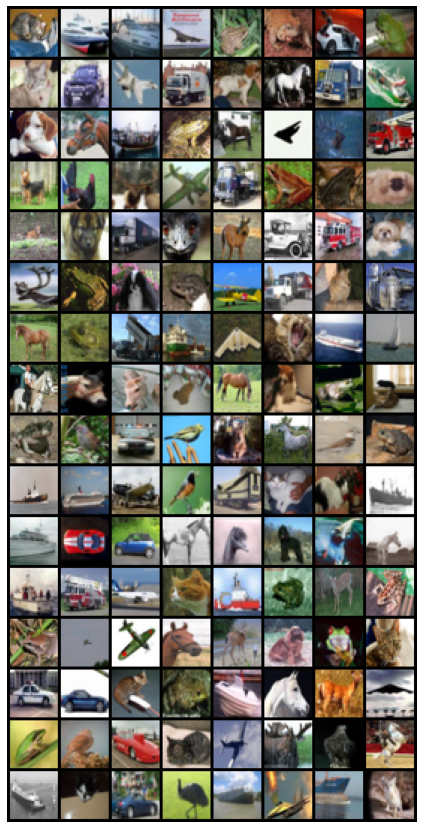

In [ ]:
samples, _ = next(iter(loader_test))

samples = samples.cpu()
samples = make_grid(denorm(samples), nrow=8, padding=2, normalize=False,
                        range=None, scale_each=False, pad_value=0)
plt.figure(figsize = (15,15))
plt.axis('off')
show(samples)

#### Model Definition
Define hyperparameters and the model

In [ ]:
# *CODE FOR PART 2.1 IN THIS CELL*

# Choose the number of epochs, the learning rate
# and the size of the Generator's input noise vetor.

num_epochs = 80
learning_rate =  4e-04
latent_vector_size = 32

# Other hyperparams
gen_feat_size = 48
dis_feat_size = 64
img_channels = 3
leak_neg_slope = 0.2
#drop_prob = 0.5


In [ ]:
# # *CODE FOR PART 2.1 IN THIS CELL*

# ## FROM RADFORD, METZ (2016) ##
# # "
# #  Architecture guidelines for stable Deep Convolutional GANs
# #     • Replace any pooling layers with strided convolutions (discriminator) and fractional-strided
# #       convolutions (generator).
# #     • Use batchnorm in both the generator and the discriminator.
# #     • Remove fully connected hidden layers for deeper architectures.
# #     • Use ReLU activation in generator for all layers except for the output, which uses Tanh.
# #     • Use LeakyReLU activation in the discriminator for all layers.
# # "


class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################

        self.generate = nn.Sequential(
            nn.ConvTranspose2d(in_channels = latent_vector_size, 
                               out_channels = gen_feat_size * 4, 
                               kernel_size = 4, stride = 1, 
                               padding = 0, bias = False),
            
            nn.BatchNorm2d(gen_feat_size * 4),
            #nn.Dropout(p=drop_prob),
            
            nn.ReLU(True),

            nn.ConvTranspose2d(in_channels = gen_feat_size * 4, 
                               out_channels = gen_feat_size * 2, 
                               kernel_size = 4, stride = 2,
                               padding = 1, bias=False),
            
            nn.BatchNorm2d(gen_feat_size * 2),
            #nn.Dropout(p=drop_prob),
            
            nn.ReLU(True),

            nn.ConvTranspose2d(in_channels = gen_feat_size * 2, 
                               out_channels = gen_feat_size, 
                               kernel_size = 4, stride = 2, 
                               padding = 1, bias=False),
            
            nn.BatchNorm2d(gen_feat_size),
            #nn.Dropout(p=drop_prob),
            
            nn.ReLU(True),


            nn.ConvTranspose2d(in_channels = gen_feat_size,
                               out_channels = img_channels, 
                               kernel_size = 4, stride = 2, 
                               padding = 1, bias=False),
            nn.Tanh()
        )

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 


    def forward(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        out = self.generate(z)
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################
        return out


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
              
        self.discriminate = nn.Sequential( 
            nn.Conv2d(in_channels = img_channels, 
                      out_channels = dis_feat_size, 
                      kernel_size = 4, stride = 2, 
                      padding= 1, bias = False),
            
            nn.BatchNorm2d(dis_feat_size),
            #nn.Dropout(p=drop_prob),

            nn.LeakyReLU(leak_neg_slope, True),

            nn.Conv2d(in_channels = dis_feat_size,
                      out_channels = dis_feat_size * 2, 
                      kernel_size = 4, stride = 2, 
                      padding = 1, bias = False),
            
            nn.BatchNorm2d(dis_feat_size * 2),
            #nn.Dropout(p=drop_prob),
            
            nn.LeakyReLU(leak_neg_slope, True),

            nn.Conv2d(in_channels = dis_feat_size * 2, 
                      out_channels = dis_feat_size * 4, 
                      kernel_size = 4, stride = 2,
                      padding = 1, bias = False),
            
            nn.BatchNorm2d(dis_feat_size * 4),
            #nn.Dropout(p=drop_prob),
            
            nn.LeakyReLU(leak_neg_slope, True),

            nn.Conv2d(dis_feat_size * 4, 
                      out_channels = 1, 
                      kernel_size = 4, stride = 1, 
                      padding = 0, bias = False),
            
            nn.Sigmoid()
        )

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        out = self.discriminate(x).view(-1, 1).squeeze(1)
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
        return out


<h2> Initialize Model and print number of parameters </h2>

You can use method `weights_init` to initialize the weights of the Generator and Discriminator networks. Otherwise, implement your own initialization, or do not use at all. You will not be penalized for not using initialization.

In [ ]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [ ]:
use_weights_init = True

model_G = Generator().to(device)
if use_weights_init:
    model_G.apply(weights_init)
params_G = sum(p.numel() for p in model_G.parameters() if p.requires_grad)
print("Total number of parameters in Generator is: {}".format(params_G))
print(model_G)
print('\n')

model_D = Discriminator().to(device)
if use_weights_init:
    model_D.apply(weights_init)
params_D = sum(p.numel() for p in model_D.parameters() if p.requires_grad)
print("Total number of parameters in Discriminator is: {}".format(params_D))
print(model_D)
print('\n')

print("Total number of parameters is: {}".format(params_G + params_D))

Total number of parameters in Generator is: 469920
Generator(
  (generate): Sequential(
    (0): ConvTranspose2d(32, 192, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(192, 96, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(96, 48, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(48, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)


Total number of parameters in Discriminator is: 663424
Discriminator(
  (discriminate): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=

### Part 2.1b: Training the Model (12 Points)

#### Defining a Loss

In [ ]:
criterion = nn.BCELoss(reduction='mean')
def loss_function(out, label):
    loss = criterion(out, label)
    return loss

<h3>Choose and initialize optimizers</h3>

In [ ]:
# setup optimizer
# You are free to add a scheduler or change the optimizer if you want. We chose one for you for simplicity.
beta1 = 0.5
gamma1 = 0.95

# Discriminator will effectively have a learning rate of value 2e-04
optimizerD = torch.optim.Adam(model_D.parameters(), lr=learning_rate / 2, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(model_G.parameters(), lr=learning_rate, betas=(beta1, 0.999))

schedD = torch.optim.lr_scheduler.StepLR(optimizerD, step_size = 1, gamma = gamma1)
schedG = torch.optim.lr_scheduler.StepLR(optimizerG, step_size = 2, gamma = gamma1)


<h3> Define fixed input vectors to monitor training and mode collapse. </h3>

In [ ]:
fixed_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
real_label = 1
fake_label = 0

#### Training Loop

In [ ]:
train_losses_G = []
train_losses_D = []

for epoch in range(num_epochs):
    for i, data in enumerate(loader_train, 0):
        train_loss_D = 0
        train_loss_G = 0
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################device
        ## train with real
        model_D.zero_grad()
        
        # Prepare Data.
        real_cpu = data[0].to(device)
        batch_size = real_cpu.size(0)
        label = torch.full((batch_size,), real_label, device=device).type(torch.FloatTensor).to(device)

        # Get Discriminator Output.
        D_out = model_D(real_cpu)

        # Get Discriminator Error.
        realD_err = loss_function(D_out, label)
        realD_err.backward()
        
        # Extract D(x)
        D_x = D_out.mean().item()

        ## train with fake
        fake_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)

        # Get Fake Generated Data from Generator Output.
        G_out = model_G(fake_noise)
        label = torch.full((batch_size,), fake_label, device=device).type(torch.FloatTensor).to(device)

        # Run Discriminator on Fake Data.
        DG_out = model_D(G_out.detach())

        # Get Discriminator Fake Error.
        fakeD_err = loss_function(DG_out, label)
        fakeD_err.backward()
        
        # Extract D(G(z1))
        D_G_z1 = DG_out.mean().item()

        # Update errD, train_loss_d for printing purposes.
        errD = realD_err + fakeD_err
        train_loss_D += errD.item()

        # Run Optimizer step.
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        model_G.zero_grad()

        # Set up real label again.
        label = torch.full((batch_size,), real_label, device=device).type(torch.FloatTensor).to(device)

        # Run Discriminator with real Label.
        DG_out = model_D(G_out)

        # Get Error.
        errG = loss_function(DG_out, label)
        errG.backward()

        # Extract D(G(z2)) and update train_loss_G for printing purposes.
        D_G_z2 = DG_out.mean().item()
        train_loss_G += errG.item()

        # Run Optimizer step.
        optimizerG.step()
        
        ###########################################################################################
        ## COMMENTING OUT THE PRINTING FUNCTION GIVEN AS FOR 100 EPOCHS WOULD RESULT IN A        ##
        ## MASSIVE OUTPUT. HENCE PRINTING JUST ONE INFO PER EPOCH OUTSIDE OF THE INNER FOR LOOP. ##
        ###########################################################################################

        # if i % print_every == 0
        #     print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
        #           % (epoch, num_epochs, i, len(loader_train),
        #             errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
    
    # Added printing function.
    print("Epoch: {} \t Dis. Loss: {} \t Gen. Loss: {}".format(epoch, round(train_loss_D, 6), round(train_loss_G, 6)))

    if schedD is not None and schedG is not None:
        schedD.step()
        schedG.step()

    if epoch == 0:
        save_image(denorm(real_cpu.cpu()).float(), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/real_samples.png')
    with torch.no_grad():
        fake = model_G(fixed_noise)
        save_image(denorm(fake.cpu()).float(), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/fake_samples_epoch_%03d.png' % epoch)
    train_losses_D.append(train_loss_D / len(loader_train))
    train_losses_G.append(train_loss_G / len(loader_train))
   
    
# save  models 
# if your discriminator/generator are conditional you'll want to change the inputs here
torch.jit.save(torch.jit.trace(model_G, (fixed_noise)), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/GAN_G_model.pth')
torch.jit.save(torch.jit.trace(model_D, (fake)), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/GAN_D_model.pth')

Epoch: 0 	 Dis. Loss: 0.904454 	 Gen. Loss: 2.193958
Epoch: 1 	 Dis. Loss: 1.999413 	 Gen. Loss: 0.987148
Epoch: 2 	 Dis. Loss: 0.828111 	 Gen. Loss: 2.983976
Epoch: 3 	 Dis. Loss: 0.971931 	 Gen. Loss: 2.457946
Epoch: 4 	 Dis. Loss: 0.996651 	 Gen. Loss: 1.918703
Epoch: 5 	 Dis. Loss: 0.717004 	 Gen. Loss: 2.052577
Epoch: 6 	 Dis. Loss: 0.816102 	 Gen. Loss: 2.387657
Epoch: 7 	 Dis. Loss: 0.913499 	 Gen. Loss: 2.130229
Epoch: 8 	 Dis. Loss: 0.938105 	 Gen. Loss: 1.861961
Epoch: 9 	 Dis. Loss: 0.930299 	 Gen. Loss: 1.491912
Epoch: 10 	 Dis. Loss: 0.920502 	 Gen. Loss: 1.789216
Epoch: 11 	 Dis. Loss: 1.034761 	 Gen. Loss: 1.731416
Epoch: 12 	 Dis. Loss: 1.011111 	 Gen. Loss: 1.390662
Epoch: 13 	 Dis. Loss: 1.009482 	 Gen. Loss: 1.216489
Epoch: 14 	 Dis. Loss: 0.911925 	 Gen. Loss: 1.545248
Epoch: 15 	 Dis. Loss: 0.914605 	 Gen. Loss: 1.520976
Epoch: 16 	 Dis. Loss: 0.894936 	 Gen. Loss: 1.098346
Epoch: 17 	 Dis. Loss: 0.910914 	 Gen. Loss: 1.181075
Epoch: 18 	 Dis. Loss: 0.80891 	 Gen. 

## Part 2.1c: Results (10 Points)
This part is fairly open-ended, but not worth too much so do not go crazy. The table below shows examples of what are considered good samples. Level 3 and above will get you 10/10 points, level 2 will roughly get you 5/10 points and level 1 and below will get you 0/10 points.

<table><tr>
<td> 
  <p align="center" style="padding: 10px">
    <img alt="Forwarding" src="https://drive.google.com/uc?id=1wQ2f10-A1Vs7k0LMfBPPyYTsPlkBF9QE" width="%30">
    <br>
    <em style="color: grey">Level 1</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1wlDhX4hROET4s8Ndxn8nhj_0RLM2rnuG" width="%30">
    <br>
    <em style="color: grey">Level 2</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1w9VrgfJLCRaTPhwoFVYdYhtCeaQmFHGb" width="%30">
    <br>
    <em style="color: grey">Level 3</em>
  </p> 
</td>
</tr></table>

### Generator samples

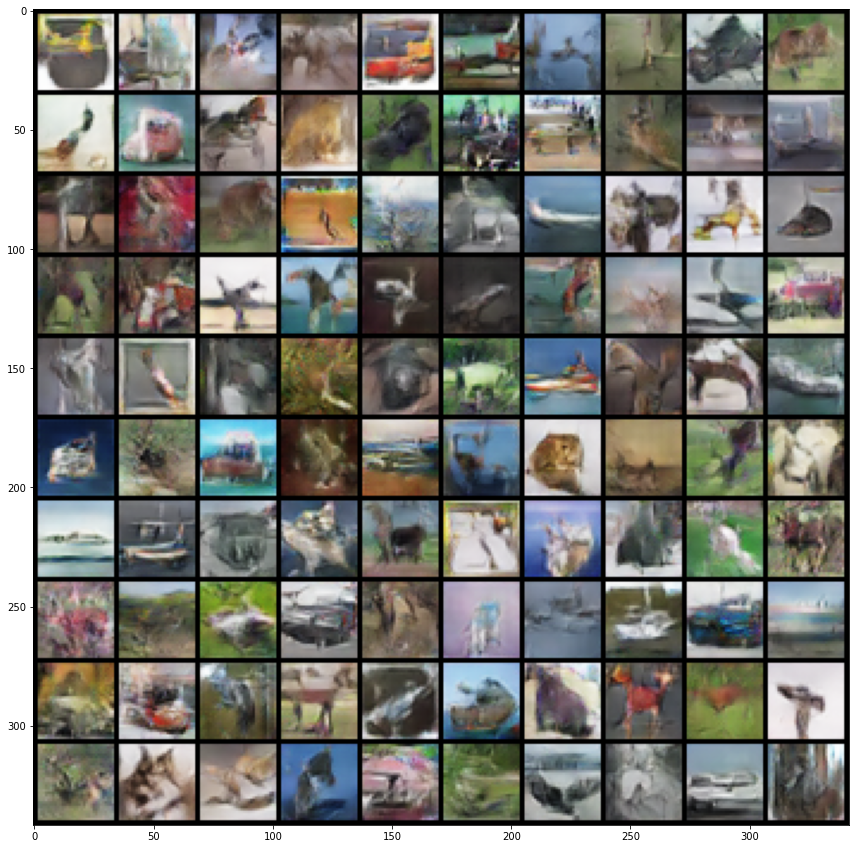

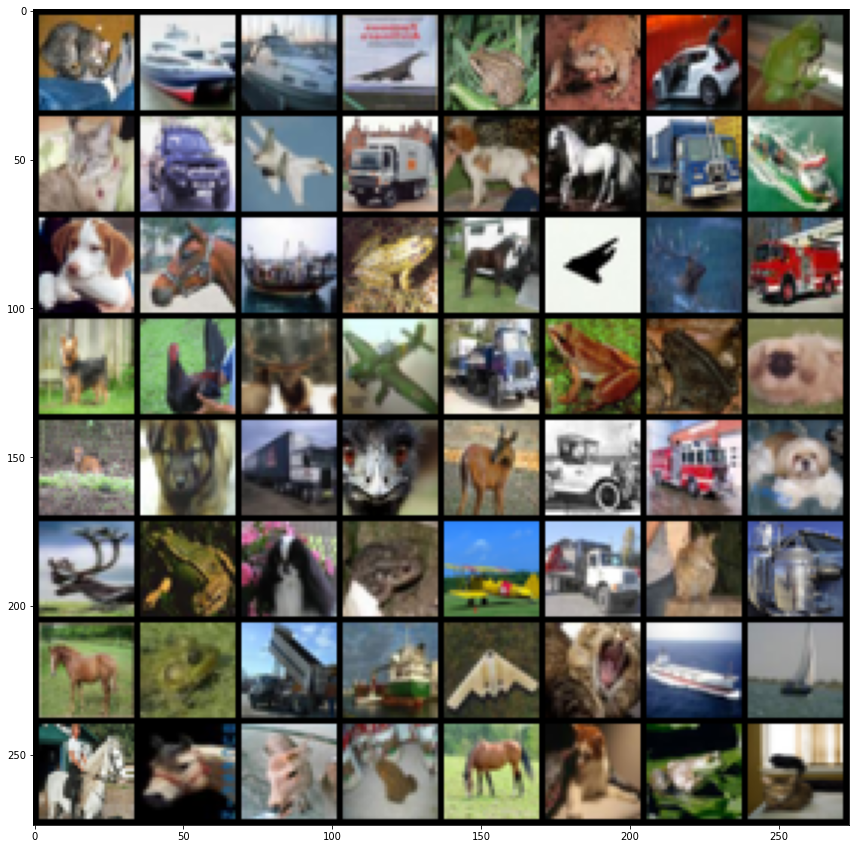

In [ ]:
input_noise = torch.randn(100, latent_vector_size, 1, 1, device=device)
with torch.no_grad():
    # visualize the generated images
    generated = model_G(input_noise).cpu()
    generated = make_grid(denorm(generated)[:100], nrow=10, padding=2, normalize=False, 
                        range=None, scale_each=False, pad_value=0)
    plt.figure(figsize=(15,15))
    save_image(generated,'/content/drive/MyDrive/icl_dl_cw2/CW_GAN/Teaching30final.png')
    show(generated) # note these are now class conditional images columns rep classes 1-10

it = iter(loader_test)
sample_inputs, _ = next(it)
fixed_input = sample_inputs[0:64, :, :, :]
# visualize the original images of the last batch of the test set for comparison
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
show(img)

## Part 2.1d: Engineering Choices (10 Points)

Discuss the process you took to arrive at your final architecture. This should include:

* Which empirically useful methods did you utilize
* What didn't work, what worked and what mattered most
* Are there any tricks you came across in the literature etc. which you suspect would be helpful here

**Your Answer**

***Bulk Architecture***

Following Radford, Metz (2016) guidelines and several other online resources I have implemented the bulk of my architecture pretty soon in the development cycle. This encompasses 4 layers of transposed 2d convolutions for the generator, which process the input information (of channel size = latent size) to an output of channel size equal to the number of channels in an image (3 as in this specific case images are RGB). In this process, each convolution doubles the output channel size, which is initially defined by the hyperparamete gen_feat_size. Finally, all convolution layers are activated using a RELU activation function, except the last one that performs Tanh (as widely suggested in literature). 
Similarly, the discriminator processes the data through 4 layers of convolution that progressively shrink the output size from 4 * dis_feat_size (an hyperparameter) to a single output channel which is finally passed through a Sigmoid activation function, forcing the final output to be in the range from 0 to 1.
It must be noted that in the discriminator, the documented state-of-the-art for Convolution layer activation function is Leaky RELU with negative slope 0.2, a design choice that stuck in my final architecture.

***Optimisation towards Convergence and no Mode Collapse***

Although the skeleton of the architecture was already there since from the beginning, it took a long time and several optimisations to make the network perform well. The latent space hyperparameter, initially set to 25, was thoroughly tuned up to the final value of 32, as it proved in testing to be the choice that most mitigated mode collapse and facilitated convergence. Furthermore, a fundamental addition was to perform Batch Normalisation after each convolution in both the generator and discriminator. BatchNorm, indeed, allowed layers to rely less on each other, improving the convergence of the DCGAN. 

As for data augmentation tecniques, Random Horizontal Image flips were implemented on the input data with a probability of 0.5. Random Noise was also tried in testing, but did not bring any significant improvement so it was eventually discarded, as discussed in the following paragraph.

Often the suggested approach with GANs is to train the discriminator more than the generator. One way to do so is to suspend the generator training for a few epochs while leaving the discriminator training going on. This approach was initially implemented, but eventually discarded for another approach found during literature research that performed better in training: utilise two different learning rates and schedulers for the two components. This approach was found to be more accurate in bringing the network to a slow and steady state of convergence (Nash Equilibrium of the two losses around 1).

Finally, the learning rates selected have been also finely tuned, as training showed that small changes could have massive impact on the convergence of the model. The final design decision was to have 4e-04 for the generator and half of this for the discriminator.

***What did not work***

Dropout layers were added after every BatchNorm in both components, as they theoretically bring an improvement complimentary to the one already observed with BatchNorm, as suggested by Hyungrok Ham et al, (2012) while also reducing the chances of overfitting, Srivastava, et al. (2014). However, in this specific case no significant improvement in the network training was observed, so eventually it was removed.
Adding Random Gaussian noise can help improve convergence as documented in literature by Arjovsky, Bottou (2017). however this was another experiment that did not bring any significant improvements in the training stage hence discarded in the final implementation.

***Remarks on The Most Important Optimisations***

In the training and optimisation process I developed the idea that, although all optimisations discussed above contributed towards the convergence of the model and many more can still be implemented to further improve it, there are some that were absolutely fundamental. I found that tuning the learning rate and schedulers had a massive impact even with small changes in magnitude, where more conservative approaches with smaller learning rates and scheduled decreases in size massively improved the DCGAN performance.
Furthermore, BatchNorm proven to be an absolutely fundamental layer to add in coping with Mode Collapse and improving the convergence of the model.






## Part 2.2: Understanding GAN Training (5 points)


### Loss Curves
**Your task:**


Plot the losses curves for the discriminator $D$ and the generator $G$ as the training progresses and explain whether the produced curves are theoretically sensible and why this is (or not) the case (x-axis: epochs, y-axis: loss).

Make sure that the version of the notebook you deliver includes these results.

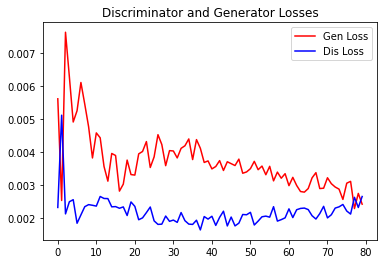

In [ ]:
# ANSWER FOR PART 2.2 IN THIS CELL*
import matplotlib.pyplot as plt
plt.plot(list(range(0, np.array(train_losses_G).shape[0])), np.array(train_losses_G), label='Gen Loss', c='r')
plt.plot(list(range(0, np.array(train_losses_D).shape[0])), np.array(train_losses_D), label='Dis Loss', c='b')
plt.legend()
plt.title('Discriminator and Generator Losses')
plt.show()


### Discussion

Do your loss curves look sensible? What would you expect to see and why?

**YOUR ANSWER**

***Commenting the plausibility of the results***

Aside from the first huge oscillations that the plot show, both losses are following a generally steady trend, although in a fairly oscillatory fashion.
The generator loss seems to stabilise on a slowly decreasing trend, which means that the discriminator is mistakingly detect more fake images generated by the former. Hence the discriminator loss increases.
Overall, they stabilise well in a convergent point around the value "0.003".
The oscillatory behaviour seems plausible, given the number of epochs and the architecture implemented, however little steadier curves would be probably ideal, and would be certainly achievable with a more thorough hyperparameter search and architecture design.

***What I expected***

The ideal result for this dual optimisation task would clearly be a perfect balance between the two components, where the discriminator can correctly detect half of the fake images generated by the generator, while misclassify the other half. However, this Nash Equilibrium is fairly difficult to achieve. The convergence value that the plot identifies at "0.003" is very good in this sense, because the percentage of inputs correctly classified by the discriminator can be calculated as this value multiplied by the batch size.
- 0.003 * 128 = 0.384.

Overall, I think this is a fairly decent distance from the ideal value of 0.5, and the DCGAN is capable of reaching a good level of convergence over the 80 epochs training.

## Part 2.3: Understanding Mode Collapse (5 points) 
**Your task:** 

Based on the images created by your generator using the `fixed_noise` vector during training, provide a discussion on whether you noticed any mode collapse, what this behaviour may be attributed to, and explain what you did in order to cope with mode collapse.

In [ ]:
# Any additional code

### Discussion


**YOUR ANSWER**

***General Remarks About Mode Collapse***

Mode collapse is detectable when analysing the generated images. If some images are repeating, it means that the generator collapsed onto a subset of the images and only learnt to generate that subset, hence it is experiencing mode collapse. One of the syntoms of mode collapse is an oscillating curve in the loss function of the generator.  Another example would be similar to that observed in Part 1: Mode collapse in MNIST would result in for example skipping numbers 5, 3 and 8 during generation (notice these we close together in the latent space of the VAE in part 1). Syntoms that suggest the presence of mode collapse are:
- oscillating losses in the generator.
- An higher loss for the discriminator.


***How to Cope with Mode Collapse***

The first "skeleton" architecture implemented, discussed in part 2.1 (d) was indeed showing some mode collapse in the output data.
It was clearly detectable by repeating images in the generated image batch, and a clear pattern in the loss evolution over number of epochs. Although the model seemingly trained well for a few epochs showing a tendency towards convergence, ultimately the discriminator loss would start diverging towards magnitudes higher than 1.
Mode Collapse was caused by several parameters of the architecture and by missing optimisations that were researched and implemented in the final architecture. These are listed below:
- Latent space size. An higher latent space size was found beneficial in coping with mode collapse.
- Generator Feature Size and Discriminator Feature Size. As these two hyperparameters were increased from the initial values of 48 and 48 respectively, mode collapse was mitigated significantly.
- Using Batch Normalisation and Dropout, which allowed to increase the independence of each layer. 
- Add noise in the images as discussed in Arjovsky, Bottou (2017).
- Use two different and smaller learning rates for generator and discriminator, with individual schedulers.

***Conclusion***

As for the final implementation submitted, the results prove that there is little to no mode collapse effect on the generated images, thanks to the inclusion of many of the methods discussed above to cope with this issue.




# TA Test Cell
TAs will run this cell to ensure that your results are reproducible, and that your models have been defined suitably. 

<font color="blue"> <b> Please provide the input and output transformations required to make your VAE and GANs work. If your GAN generator requires more than just noise as input, also specify this below (there are two marked cells for you to inspect) </b></font>


In [ ]:
# If you want to run these tests yourself, change directory:
# !cd /content/drive/MyDrive/icl_dl_cw2/

In [12]:
!pip install -q torch torchvision

In [19]:
# Do not remove anything here
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt 

show = lambda img: plt.imshow(np.transpose(img.cpu().numpy(), (1,2,0)))

device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")

# Do not change this cell!
torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

In [20]:
############# CHANGE THESE (COPY AND PASTE FROM YOUR OWN CODE) #############
vae_transform = transforms.Compose([
    transforms.ToTensor(),
    lambda x: x.round()
])

def vae_denorm(x):
    return x

def gan_denorm(x):
    x = 0.5 * (x + 1)
    x = x.clamp(0, 1)
    return x

gan_latent_size = 32

# If your generator requires something other than noise as input, please specify
# two cells down from here

In [21]:
# Load VAE Dataset
test_dat = datasets.MNIST("./data/", train=False, transform=vae_transform, 
                          download=True)
vae_loader_test = DataLoader(test_dat, batch_size=32, shuffle=False)

In [22]:
############# MODIFY IF NEEDED #############
vae_input, _ = next(iter(vae_loader_test))

# If your generator is conditional, then please modify this input suitably
input_noise = torch.randn(100, gan_latent_size, 1, 1, device=device)
gan_input = [input_noise] # In case you want to provide a tuple, we wrap ours

Used Convs


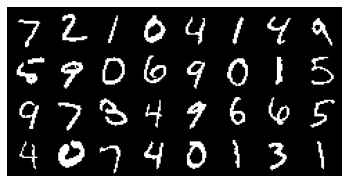

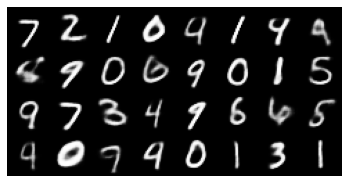

In [23]:
# VAE Tests
# TAs will change these paths as you will have provided the model files manually
"""To TAs, you should have been creating a folder with the student uid
   And the .ipynb + models in the root. Then that path is './VAE_model.pth' etc.
"""
vae = model_G = torch.jit.load('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/VAE_model.pth')
vae.eval()

# Check if VAE is convolutional

for module in vae.children():
    for layer in module.children():
        if "Conv2d" in layer.original_name:
            print("Used Convs")
            break

vae_in = make_grid(vae_denorm(vae_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_in)

vae_test = vae(vae_input.to(device))[0].detach()
vae_reco = make_grid(vae_denorm(vae_test), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_reco)

Number of Parameters is 1133344 which is ok


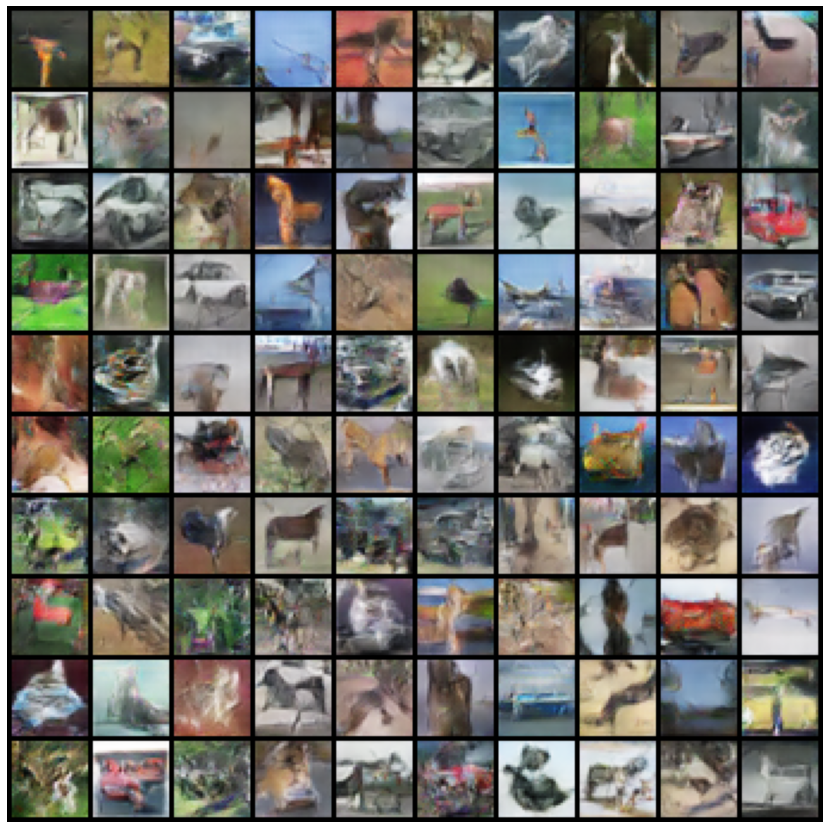

In [24]:
# GAN Tests
model_G = torch.jit.load('/content/drive/MyDrive/icl_dl_cw2/CW_GAN/GAN_G_model.pth')
model_D = torch.jit.load('/content/drive/MyDrive/icl_dl_cw2/CW_GAN/GAN_D_model.pth')
[model.eval() for model in (model_G, model_D)]  

# Check that GAN doesn't have too many parameters
num_param = sum(p.numel() for p in [*model_G.parameters(),*model_D.parameters()])

print(f"Number of Parameters is {num_param} which is", "ok" if num_param<25E+6 else "not ok")

# visualize the generated images
generated = model_G(*gan_input).cpu()
generated = make_grid(gan_denorm(generated)[:100].detach(), nrow=10, padding=2, normalize=False, 
                    range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
plt.axis('off')
show(generated)